#Importing Libraries


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import cv2
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.python.data.experimental import AUTOTUNE
import warnings
warnings.filterwarnings('ignore')

#Data Exploration

In [ ]:
def plot_images(tf_dataset,n_rows,figsize=(30,30)):
    # subplots
    fig,axes = plt.subplots(nrows =n_rows, ncols = 2, figsize=figsize)
    for ax in axes.flatten():
        ax.axis('off')
    count = -1
    for lr, hr in tf_dataset.take(n_rows).as_numpy_iterator():
        count+=1
        print('LR Shape is {} and HR shape is {}'.format(lr[0].shape,hr[0].shape))
        axes[count,0].set_title('Low resolution',fontdict={'fontsize': 20,'fontweight': 'bold'})
        axes[count,0].imshow(lr[0])
        axes[count,1].set_title('High Resolution',fontdict={'fontsize': 20,'fontweight': 'bold'})
        axes[count,1].imshow(hr[0])

In [ ]:
def center_crop(lr_img, hr_img, hr_crop_size=320, scale=4):
    ''' This function crops lr(64x64) and hr(256x256) images at the center'''
    lr_crop_size = hr_crop_size // scale

    lr_shape = tf.shape(lr_img)[:2]
    hr_shape = tf.shape(hr_img)[:2]

    lr_x = (lr_shape[1] - lr_crop_size) // 2
    lr_y = (lr_shape[0] - lr_crop_size) // 2

    hr_x = (hr_shape[1] - hr_crop_size) // 2
    hr_y = (hr_shape[0] - hr_crop_size) // 2

    lr_img_cropped = lr_img[lr_y:lr_y + lr_crop_size, lr_x:lr_x + lr_crop_size]
    hr_img_cropped = hr_img[hr_y:hr_y + hr_crop_size, hr_x:hr_x + hr_crop_size]

    return lr_img_cropped, hr_img_cropped

def random_flip(lr_img, hr_img):
    ''' This function will flip imag left_right randomly'''
    random = tf.random.uniform(shape=(), maxval=1)
    return tf.cond(random < 0.5,lambda: (lr_img, hr_img),
                   lambda: (tf.image.flip_left_right(lr_img),
                            tf.image.flip_left_right(hr_img)))

def random_rotate(lr_img, hr_img):
    ''' This function will rotate image randomly to 90 degree'''
    rand = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    return tf.image.rot90(lr_img, rand), tf.image.rot90(hr_img, rand)

In [ ]:
div2k = tfds.image.Div2k(config='bicubic_x4')
div2k.download_and_prepare()

EXTRACTING {'train_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X4.zip', 'valid_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X4.zip', 'train_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip', 'valid_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip'}


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/800 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/incomplete.7G6GLK_2.0.0/div2k-train.tfrecord*...:   0%|  …

Generating validation examples...:   0%|          | 0/100 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/incomplete.7G6GLK_2.0.0/div2k-validation.tfrecord*...:   …

Dataset div2k downloaded and prepared to /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0. Subsequent calls will reuse this data.


In [ ]:
ds_train = div2k.as_dataset(split='train', as_supervised=True)
ds_valid = div2k.as_dataset(split='validation', as_supervised=True)

In [ ]:
d_train = ds_train.cache()
d_valid = ds_valid.cache()

In [ ]:
type(d_train)

tensorflow.python.data.ops.cache_op.CacheDataset

In [ ]:
type(ds_train)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [ ]:
print('Train cardinality = ',ds_train.cardinality().numpy())
print('Validation cardinality = ',ds_valid.cardinality().numpy())

Train cardinality =  800
Validation cardinality =  100


In [ ]:
def preprocessing(data, batch_size=1,scale=5,repeat_count=None, random_transform=True):
        if random_transform:
            data = data.map(lambda lr, hr: center_crop(lr, hr, scale=scale),num_parallel_calls=AUTOTUNE)
        data = data.batch(batch_size)
        data = data.repeat(repeat_count)
        data = data.prefetch(buffer_size=AUTOTUNE)
        return data

In [ ]:
train_preprocessed = preprocessing(d_train)
valid_preprocessed = preprocessing(d_valid,batch_size=1,repeat_count=1,random_transform=False)

In [ ]:
print('Train cardinality = ',train_preprocessed.cardinality().numpy())
print('Validation cardinality',valid_preprocessed.cardinality().numpy())

Train cardinality =  -1
Validation cardinality 100


LR Shape is (64, 64, 3) and HR shape is (320, 320, 3)
LR Shape is (64, 64, 3) and HR shape is (320, 320, 3)


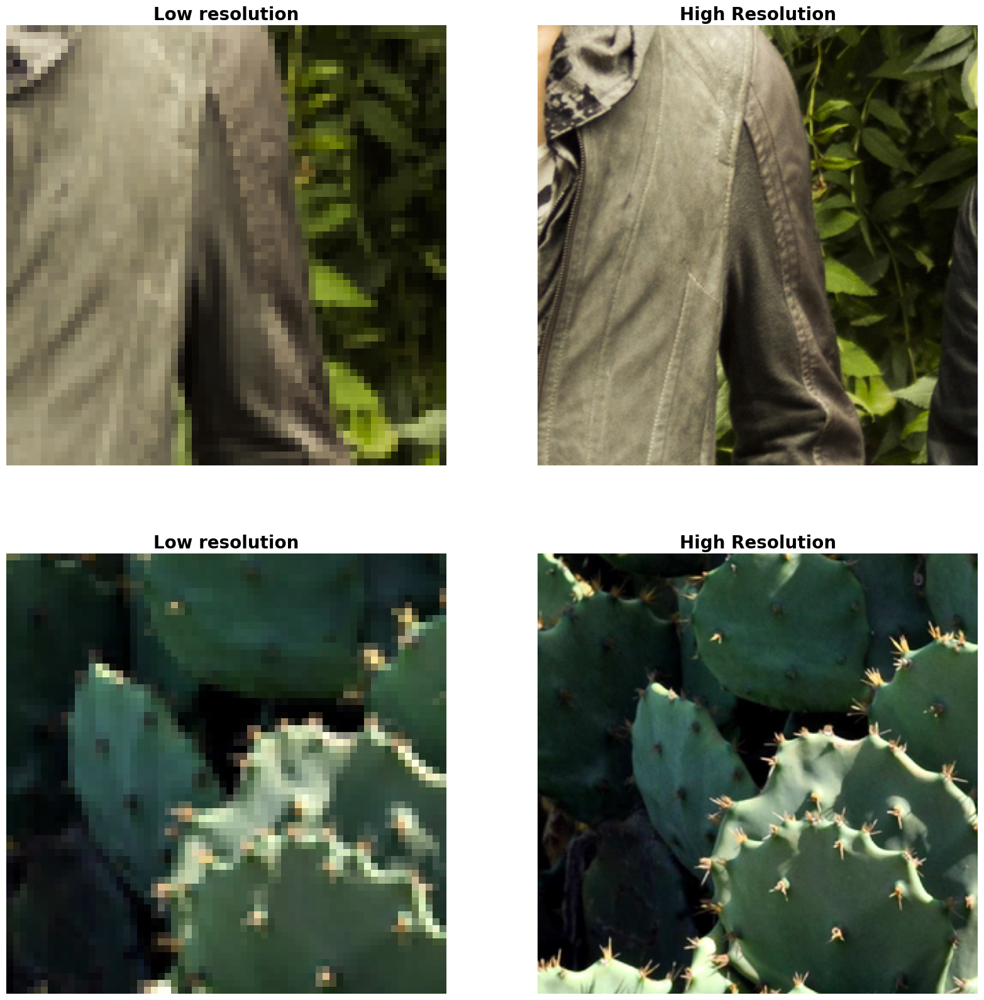

In [ ]:
plot_images(train_preprocessed,n_rows=2, figsize=(20, 20))

LR Shape is (510, 417, 3) and HR shape is (2040, 1668, 3)
LR Shape is (393, 510, 3) and HR shape is (1572, 2040, 3)


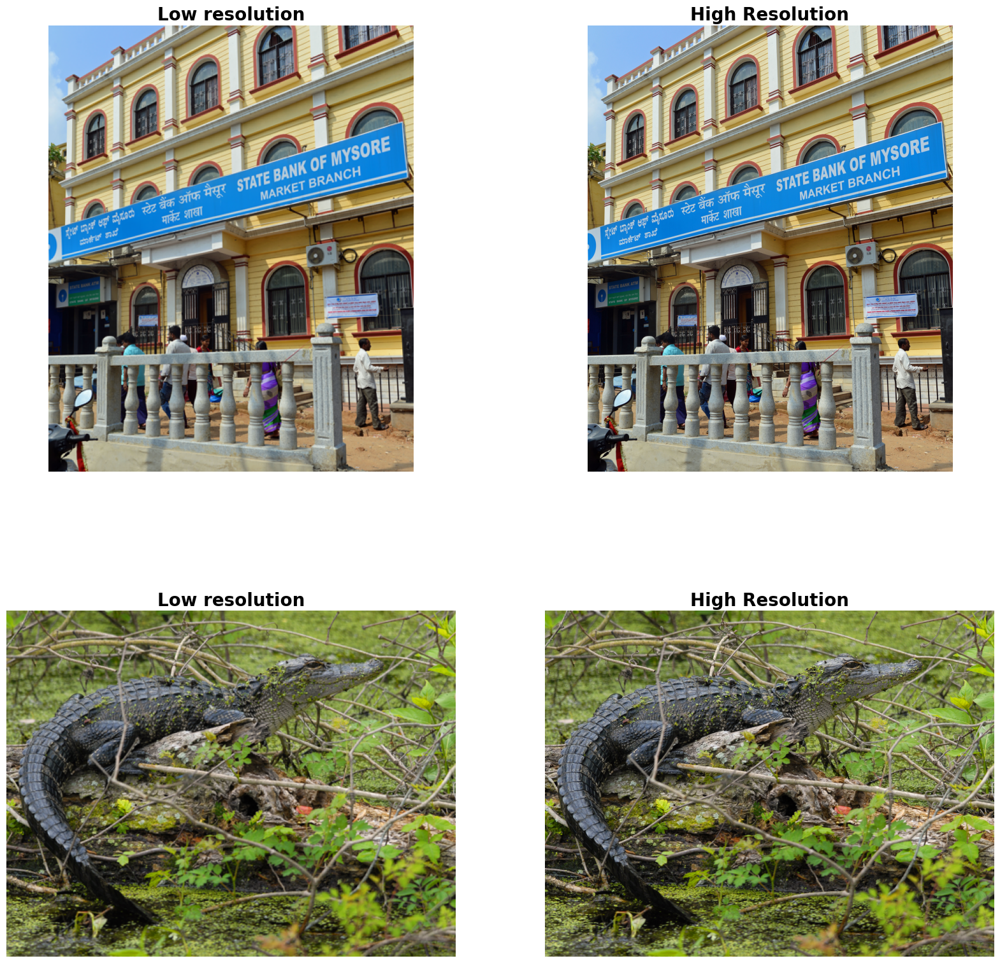

In [ ]:
plot_images(valid_preprocessed,n_rows=2, figsize=(20, 20))

#Downscaling

In [ ]:
def plot_images(original_images, downscaled_images, num_images=5):
    plt.figure(figsize=(10, 4 * num_images))
    for i in range(num_images):
        # Plot original image
        plt.subplot(num_images, 2, 2 * i + 1)
        plt.imshow(original_images[i])
        plt.title("Original Image")
        plt.axis("off")

        # Plot downscaled image
        plt.subplot(num_images, 2, 2 * i + 2)
        plt.imshow(downscaled_images[i])
        plt.title("Downscaled Image")
        plt.axis("off")
    plt.show()

In [ ]:
n_data = 300
scale_factor = 0.2

##Seam-Carving

In [ ]:
!pip install seam-carving

In [ ]:
import seam_carving
seam_carving_downscaled_img = []
ori_img_sc = []

count=0

for lr, hr in train_preprocessed.take(n_data).as_numpy_iterator():
  count=count+1
  if (count%100==0):
      print("100")
      count=0
  src = hr[0]
  src_h, src_w, _ = src.shape
  dst = seam_carving.resize(
    src,
    size=(src_w*scale_factor, src_h*scale_factor),
    energy_mode="backward",
    order="width-first",
    keep_mask=None,
  )
  seam_carving_downscaled_img.append(dst)
  ori_img_sc.append(hr[0])

100
100
100


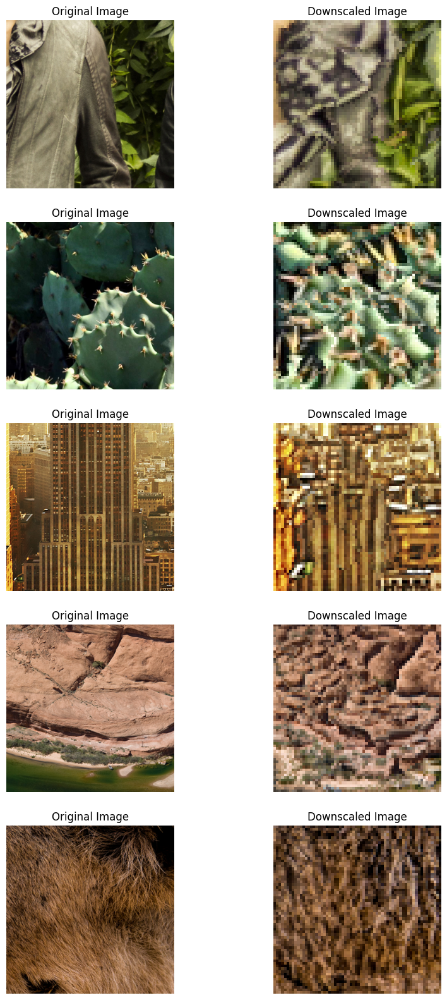

In [ ]:
plot_images(ori_img_sc, seam_carving_downscaled_img, num_images=5)

##DPID

In [ ]:
def dpid_downscale(image):
  src = image
  [iHeight, iWidth, channels]= src.shape
  oWidth=64
  oHeight=64
  _lambda=1.0
  avgImage = np.zeros([oHeight, oWidth, channels])
  oImage   = np.zeros([oHeight, oWidth, channels])
  pWidth  = iWidth  / oWidth
  pHeight = iHeight / oHeight
  for py in range(oHeight):
      for px in range(oWidth):
          sx = max(px * pWidth, 0)
          ex = min((px+1) * pWidth, iWidth)
          sy = max(py * pHeight, 0)
          ey = min((py+1) * pHeight, iHeight)

          sxr = math.floor(sx)
          syr = math.floor(sy)
          exr = math.ceil(ex)
          eyr = math.ceil(ey)

          avgF = 0

          for iy in range(syr,eyr):
              for ix in range(sxr,exr):
                  f=1
                  if(ix < sx):
                      f = f * (1.0 - (sx - ix))
                  if((ix+1) > ex):
                      f = f * (1.0 - ((ix+1) - ex))
                  if(iy < sy):
                      f = f * (1.0 - (sy - iy))
                  if((iy+1) > ey):
                      f = f * (1.0 - ((iy+1) - ey))
                  avgImage[py, px, :] = avgImage[py, px, :] + (src[iy, ix, :] * f)
                  avgF = avgF + f
          avgImage[py, px, :] = avgImage[py, px, :] / avgF
  for py in range(oHeight):
      for px in range(oWidth):
          avg=np.zeros([1, channels + 1])
          if(py > 0):
              if(px > 0):
                  avg = avg + np.append(np.reshape(avgImage[py-1, px-1,   :], [1,channels]) * 1,1)
              avg = avg + np.append(np.reshape(avgImage[py-1, px+0, :], [1,channels]) * 2,2)
              if((px+1) < oWidth):
                  avg = avg + np.append(np.reshape(avgImage[py-1, px+1, :], [1,channels]) * 1,1)
          if(px > 0):
              avg = avg + np.append(np.reshape(avgImage[py+0, px-1,   :], [1,channels]) * 2,2)
          avg = avg + np.append(np.reshape(avgImage[py+0, px+0, :], [1,channels]) * 4,4)
          if((px+1) < oWidth):
              avg = avg + np.append(np.reshape(avgImage[py+0, px+1, :], [1,channels]) * 2,2)

          if((py+1) < oHeight):
              if(px > 0):
                  avg = avg + np.append(np.reshape(avgImage[py+1, px-1,   :], [1,channels]) * 1,1)
              avg = avg + np.append(np.reshape(avgImage[py+1, px+0, :], [1,channels]) * 2,2)
              if((px+1) < oWidth):
                  avg = avg + np.append(np.reshape(avgImage[py+1, px+1, :], [1,channels]) * 1,1)
          if avg[0][3]==4:
              print(avg[0][3])
          avg = avg / avg[0][3]
          avg = avg[0][0:channels]
          sx = max(px * pWidth, 0)
          ex = min((px+1) * pWidth, iWidth)
          sy = max(py * pHeight, 0)
          ey = min((py+1) * pHeight, iHeight)

          sxr = math.floor(sx)
          syr = math.floor(sy)
          exr = math.ceil(ex)
          eyr = math.ceil(ey)

          oF = 0

          for iy in range(syr,(eyr)):
              for ix in range(sxr,(exr)):
                  if _lambda == 0:
                      f = 1
                  else:
                      f=np.linalg.norm(avg - np.reshape(src[iy + 0, ix + 0, :], [1,channels]),2)
                      #f=f/441.6729559
                      f = f **_lambda

                  if(ix < sx):
                      f = f * (1.0 - (sx - ix))
                  if((ix+1) > ex):
                      f = f * (1.0 - ((ix+1) - ex))
                  if(iy < sy):
                      f = f * (1.0 - (sy - iy))
                  if((iy+1) > ey):
                      f = f * (1.0 - ((iy+1) - ey))

                  oImage[py + 0, px + 0, :] = oImage[py + 0, px + 0, :] + (src[iy + 0, ix + 0, :] * f)
                  oF = oF + f

          if (oF == 0):
              oImage[py + 0, px + 0, :] = avg
          else:
              oImage[py + 0, px + 0, :] = oImage[py + 0, px + 0, :] / oF
  oImage /= 255.0
  return oImage

In [ ]:
dpid_downscaled_img = []
ori_img_dpid = []

In [ ]:
print("Train")
count = 0
for lr, hr in train_preprocessed.take(n_data).as_numpy_iterator():
    count += 1
    if count % 100 == 0:
        print(f"Processed {count} images")
    downscaled_image = dpid_downscale(hr[0])
    dpid_downscaled_img.append(downscaled_image)
    ori_img_dpid.append(hr[0])

dpid_downscaled_img = np.array(dpid_downscaled_img)
ori_img_dpid = np.array(ori_img_dpid)

print("Processing complete.")

Train
Processed 100 images
Processed 200 images
Processed 300 images
Processing complete.


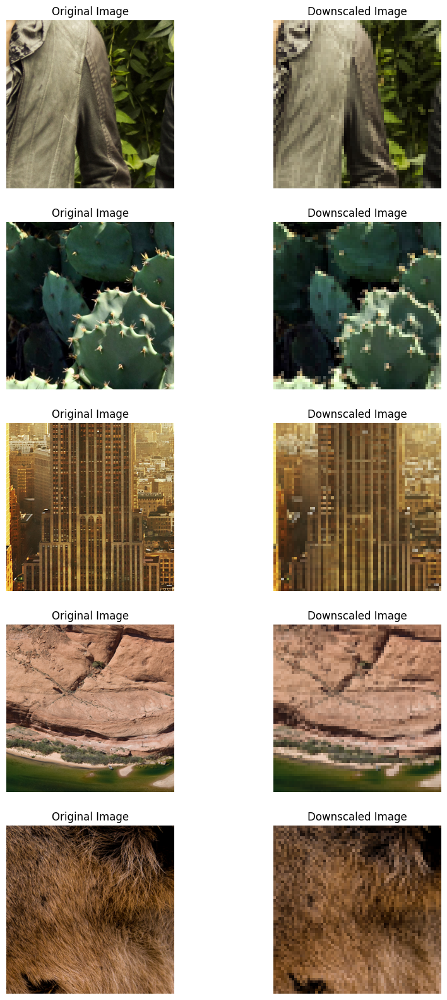

In [ ]:
plot_images(ori_img_dpid, dpid_downscaled_img, num_images=5)

##Analysis

In [ ]:
from skimage.measure import shannon_entropy
from sklearn.cluster import KMeans
import seaborn as sns
from skimage import color

In [ ]:
ori_img_dpid_sample = ori_img_dpid[0]
dpid_downscaled_img_sample = dpid_downscaled_img[0]
ori_img_sc_sample = ori_img_sc[0]
seam_carving_downscaled_img_sample = seam_carving_downscaled_img[0]
print(ori_img_sc_sample.shape)
print(seam_carving_downscaled_img_sample.shape)
print(ori_img_dpid_sample.shape)
print(dpid_downscaled_img_sample.shape)

(320, 320, 3)
(64, 64, 3)
(320, 320, 3)
(64, 64, 3)


In [ ]:
# Compute Entropy
original_entropy = shannon_entropy(ori_img_sc_sample)
downscaled_entropy = shannon_entropy(seam_carving_downscaled_img_sample)
print(f'Original Entropy: {original_entropy}')
print(f'Downscaled Entropy: {downscaled_entropy}')

Original Entropy: 7.628582403618913
Downscaled Entropy: 7.6219253538455405


In [ ]:
def plot_color_histograms(original, downscaled):
    color = ('r', 'g', 'b')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Color Histograms')

    ax1.set_title('Original')
    for i, col in enumerate(color):
        orig_hist = cv2.calcHist([np.uint8(original)], [i], None, [256], [0, 256])
        ax1.plot(orig_hist, color=col)
    ax1.set_xlabel('Pixel Value')
    ax1.set_ylabel('Frequency')

    ax2.set_title('Downscaled')
    for i, col in enumerate(color):
        down_hist = cv2.calcHist([np.uint8(downscaled)], [i], None, [256], [0, 256])
        ax2.plot(down_hist, color=col)
    ax2.set_xlabel('Pixel Value')
    ax2.set_ylabel('Frequency')

    plt.show()

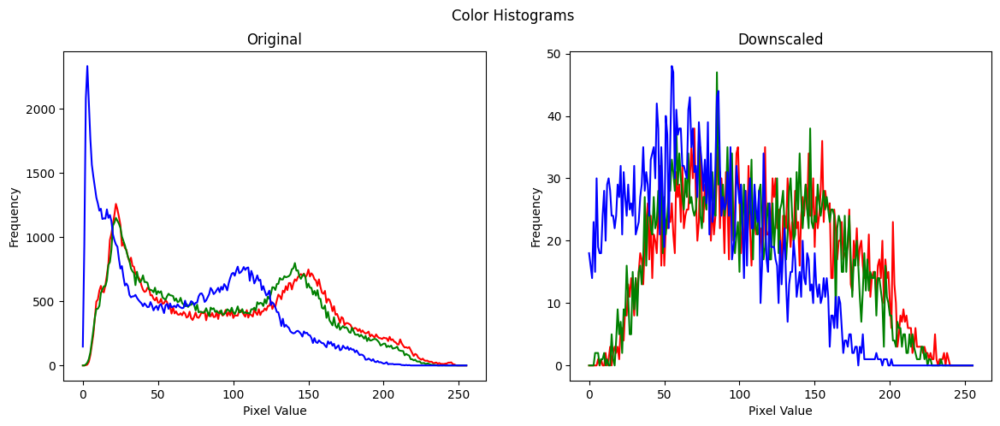

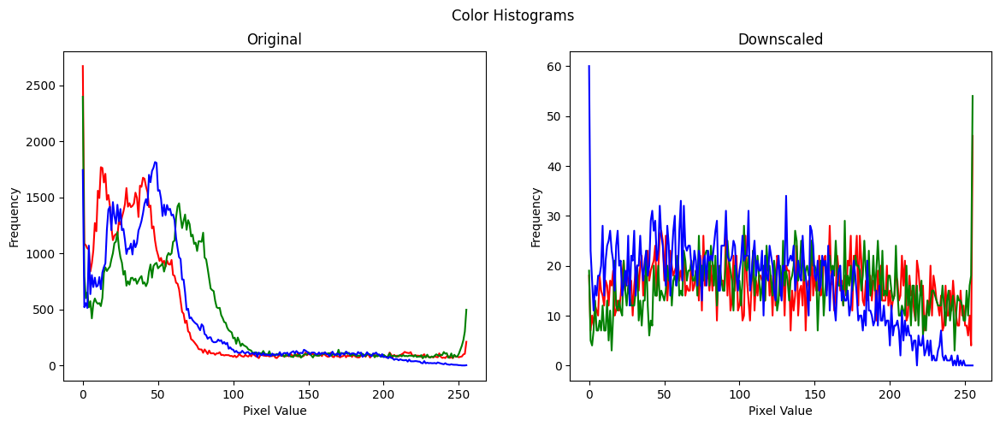

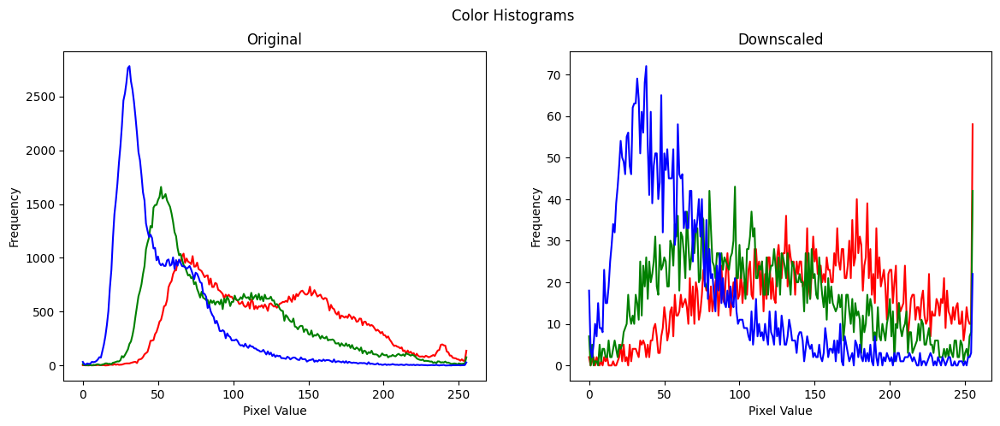

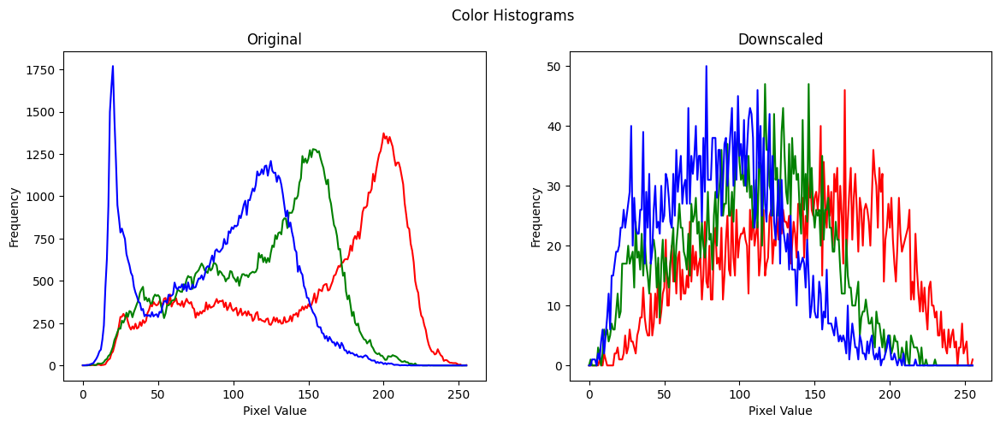

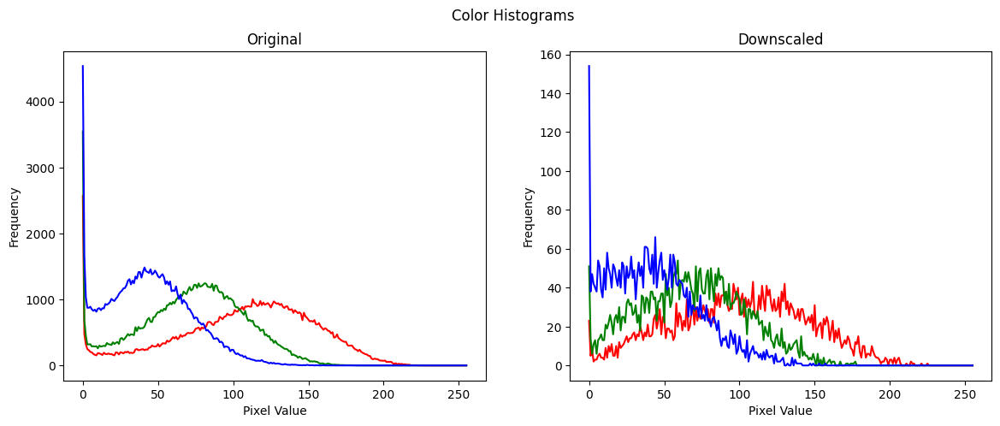

In [ ]:
for i in range(5):  # Plot histograms for 5 samples
    plot_color_histograms(ori_img_sc[i], seam_carving_downscaled_img[i])

In [ ]:
def get_dominant_colors(image, k=5):
    pixels = np.float32(image.reshape(-1, 3))
    _, labels, palette = cv2.kmeans(pixels, k, None,
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                                    10, cv2.KMEANS_RANDOM_CENTERS)
    _, counts = np.unique(labels, return_counts=True)
    dominant_colors = palette[np.argsort(-counts)]
    return dominant_colors.astype(int), counts

def plot_dominant_colors(dominant_colors, counts):
    plt.figure(figsize=(8, 4))
    plt.pie(counts, labels=[f'#{r:02x}{g:02x}{b:02x}' for r, g, b in dominant_colors],
            colors=[(r/255, g/255, b/255) for r, g, b in dominant_colors], startangle=90)
    plt.axis('equal')
    plt.title('Dominant Colors')
    plt.show()

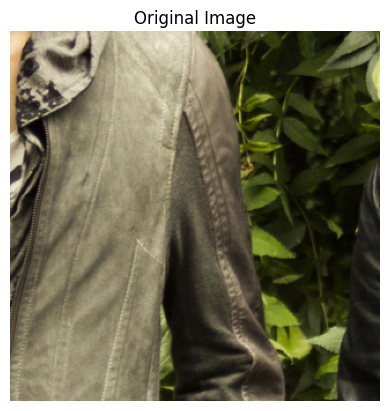

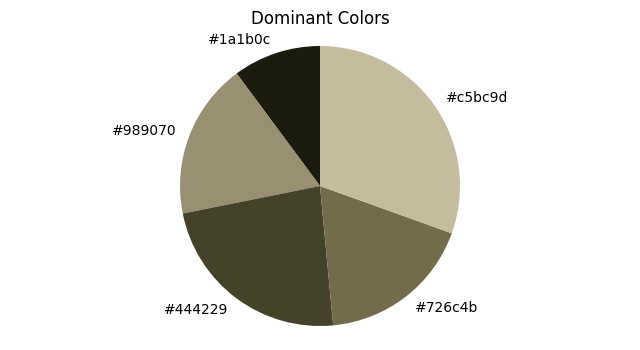

Color: #1a1b0c, Percentage: 10.15%
Color: #989070, Percentage: 18.00%
Color: #444229, Percentage: 23.35%
Color: #726c4b, Percentage: 18.01%
Color: #c5bc9d, Percentage: 30.49%


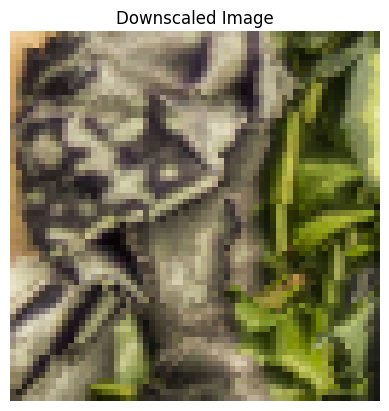

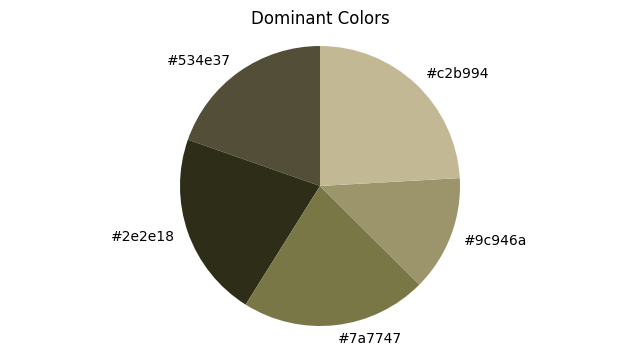

Color: #534e37, Percentage: 19.63%
Color: #2e2e18, Percentage: 21.46%
Color: #7a7747, Percentage: 21.46%
Color: #9c946a, Percentage: 13.35%
Color: #c2b994, Percentage: 24.10%


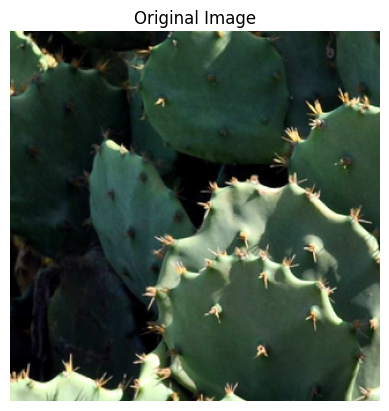

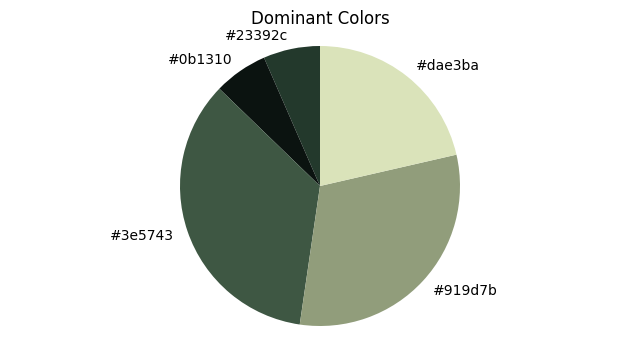

Color: #23392c, Percentage: 6.55%
Color: #0b1310, Percentage: 6.22%
Color: #3e5743, Percentage: 34.92%
Color: #919d7b, Percentage: 30.91%
Color: #dae3ba, Percentage: 21.41%


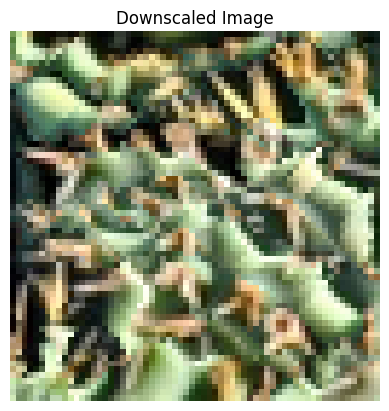

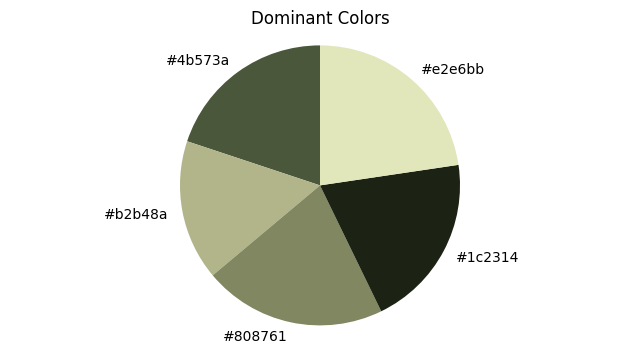

Color: #4b573a, Percentage: 19.90%
Color: #b2b48a, Percentage: 16.21%
Color: #808761, Percentage: 21.09%
Color: #1c2314, Percentage: 20.14%
Color: #e2e6bb, Percentage: 22.66%


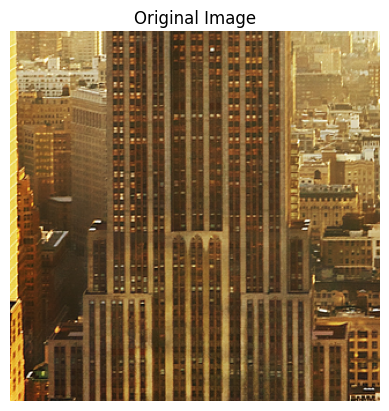

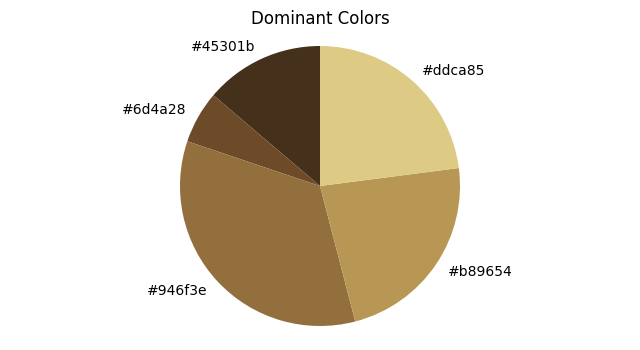

Color: #45301b, Percentage: 13.78%
Color: #6d4a28, Percentage: 6.04%
Color: #946f3e, Percentage: 34.23%
Color: #b89654, Percentage: 23.00%
Color: #ddca85, Percentage: 22.95%


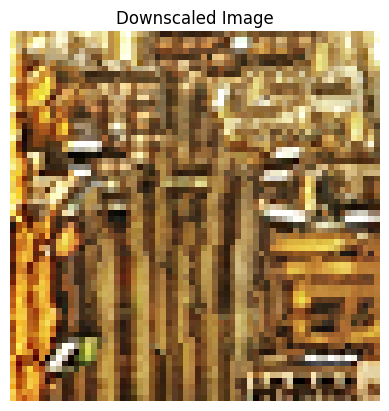

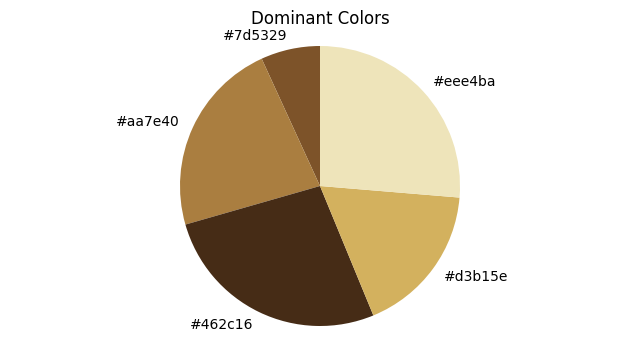

Color: #7d5329, Percentage: 6.84%
Color: #aa7e40, Percentage: 22.61%
Color: #462c16, Percentage: 26.78%
Color: #d3b15e, Percentage: 17.46%
Color: #eee4ba, Percentage: 26.32%


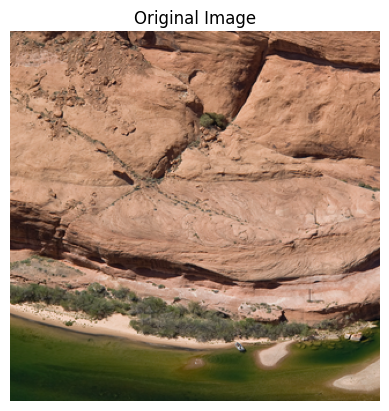

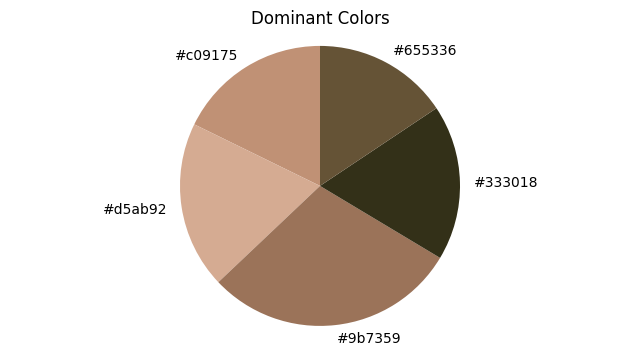

Color: #c09175, Percentage: 17.75%
Color: #d5ab92, Percentage: 19.31%
Color: #9b7359, Percentage: 29.34%
Color: #333018, Percentage: 17.96%
Color: #655336, Percentage: 15.63%


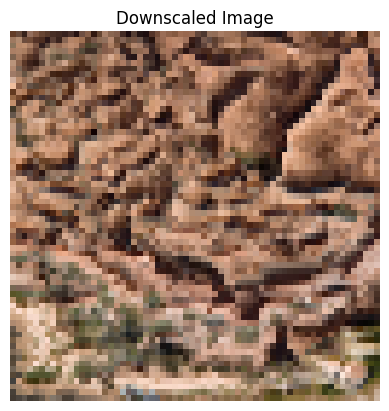

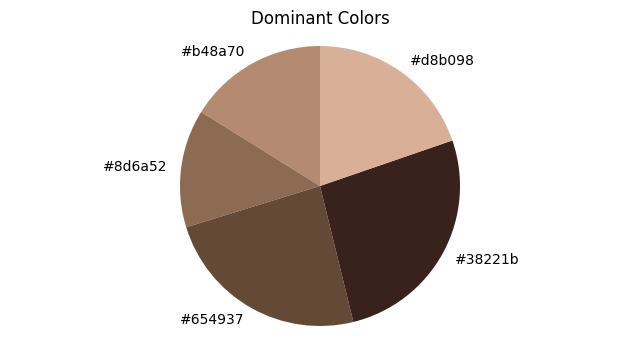

Color: #b48a70, Percentage: 16.14%
Color: #8d6a52, Percentage: 13.62%
Color: #654937, Percentage: 24.07%
Color: #38221b, Percentage: 26.44%
Color: #d8b098, Percentage: 19.73%


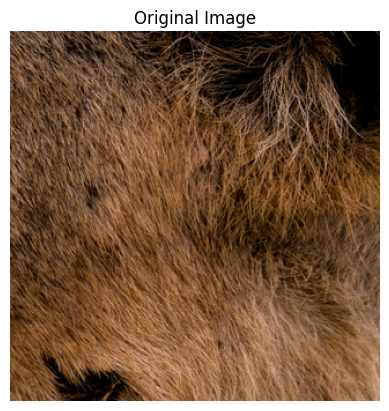

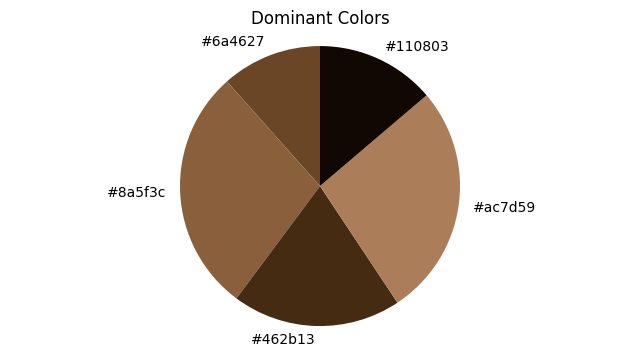

Color: #6a4627, Percentage: 11.57%
Color: #8a5f3c, Percentage: 28.25%
Color: #462b13, Percentage: 19.51%
Color: #ac7d59, Percentage: 26.89%
Color: #110803, Percentage: 13.78%


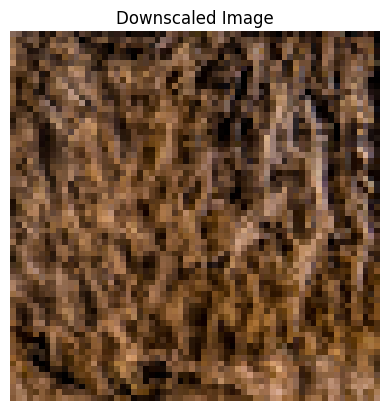

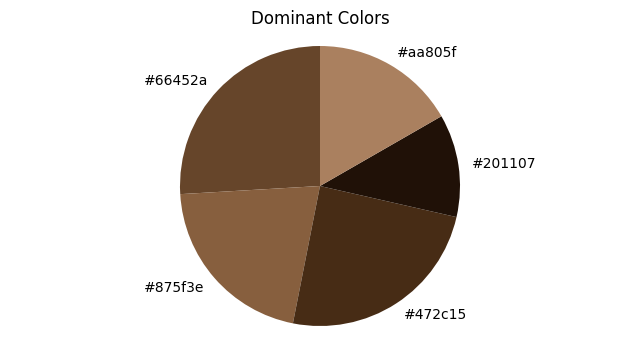

Color: #66452a, Percentage: 25.93%
Color: #875f3e, Percentage: 20.97%
Color: #472c15, Percentage: 24.54%
Color: #201107, Percentage: 11.87%
Color: #aa805f, Percentage: 16.70%


In [ ]:
for i in range(5):
    ori_img_sc_sample = ori_img_sc[i]
    seam_carving_downscaled_img_sample = seam_carving_downscaled_img[i]

    dominant_colors_ori, counts_ori = get_dominant_colors(ori_img_sc_sample, k=5)
    dominant_colors_dwn, counts_dwn = get_dominant_colors(seam_carving_downscaled_img_sample, k=5)

    plt.imshow(ori_img_sc_sample)
    plt.title('Original Image')
    plt.axis('off')
    plt.show()

    plot_dominant_colors(dominant_colors_ori, counts_ori)

    total_pixels_ori = np.sum(counts_ori)
    percentage_colors_ori = (counts_ori / total_pixels_ori) * 100

    for color, percentage in zip(dominant_colors_ori, percentage_colors_ori):
        print(f'Color: #{color[0]:02x}{color[1]:02x}{color[2]:02x}, Percentage: {percentage:.2f}%')

    plt.imshow(seam_carving_downscaled_img_sample)
    plt.title('Downscaled Image')
    plt.axis('off')
    plt.show()

    plot_dominant_colors(dominant_colors_dwn, counts_dwn)

    total_pixels_dwn = np.sum(counts_dwn)
    percentage_colors_dwn = (counts_dwn / total_pixels_dwn) * 100

    for color, percentage in zip(dominant_colors_dwn, percentage_colors_dwn):
        print(f'Color: #{color[0]:02x}{color[1]:02x}{color[2]:02x}, Percentage: {percentage:.2f}%')

In [ ]:
# Plot Color Scatter
def plot_color_scatter(original, downscaled):
    orig_pixels = original.reshape(-1, 3)
    down_pixels = downscaled.reshape(-1, 3)

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    sns.scatterplot(x=orig_pixels[:, 0], y=orig_pixels[:, 1], hue=orig_pixels[:, 2], palette="viridis", ax=axs[0])
    axs[0].set_title('Original Image Color Scatter')
    axs[0].set_xlabel('Channel 0')
    axs[0].set_ylabel('Channel 1')

    sns.scatterplot(x=down_pixels[:, 0], y=down_pixels[:, 1], hue=down_pixels[:, 2], palette="viridis", ax=axs[1])
    axs[1].set_title('Downscaled Image Color Scatter')
    axs[1].set_xlabel('Channel 0')
    axs[1].set_ylabel('Channel 1')

    plt.show()

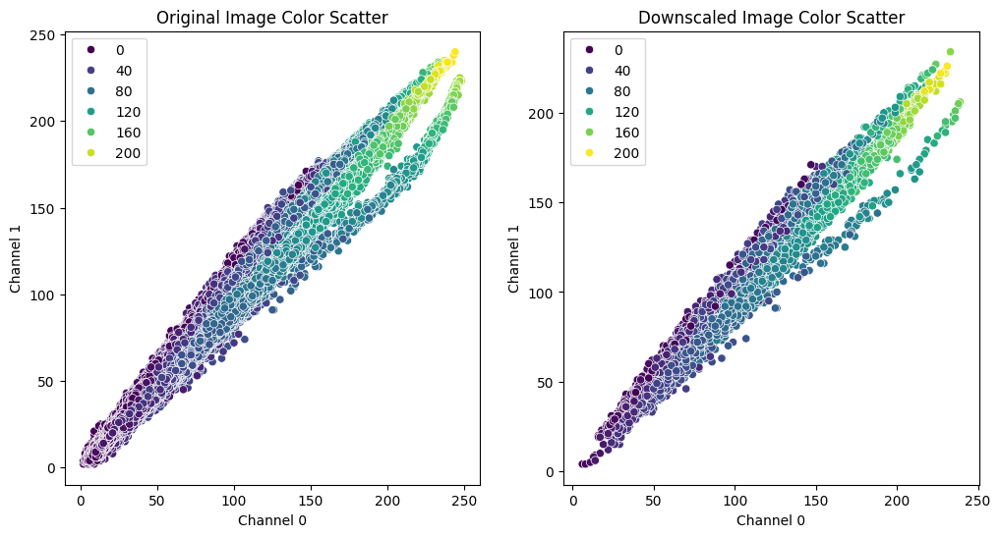

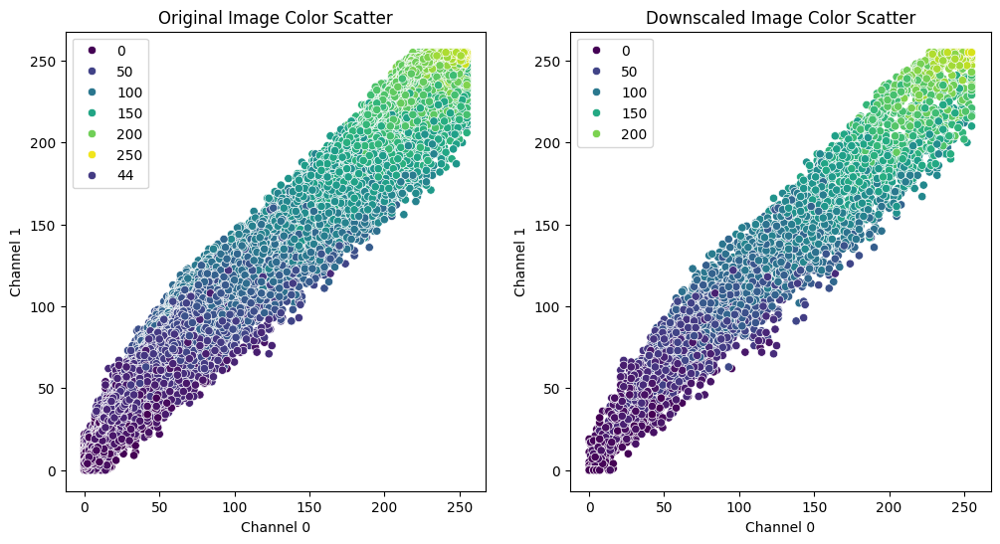

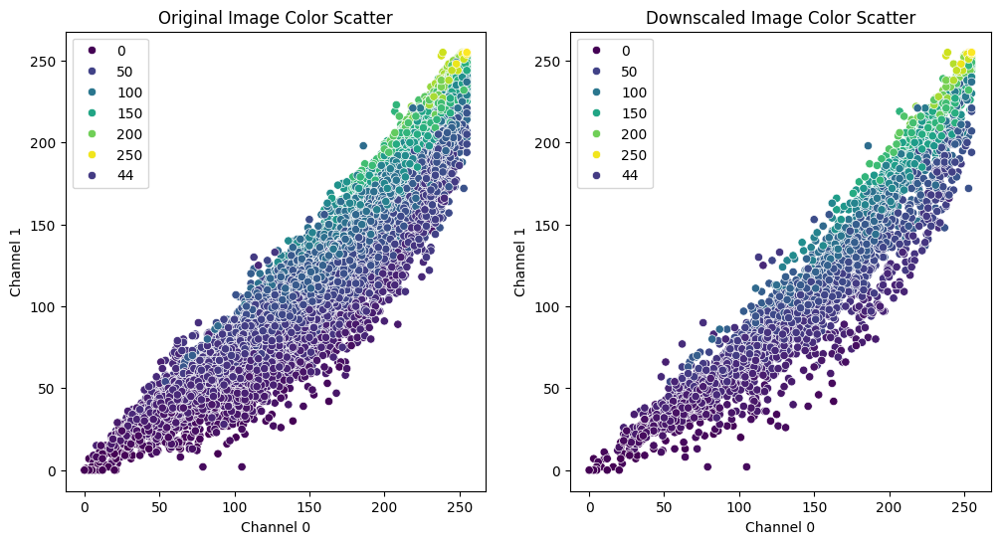

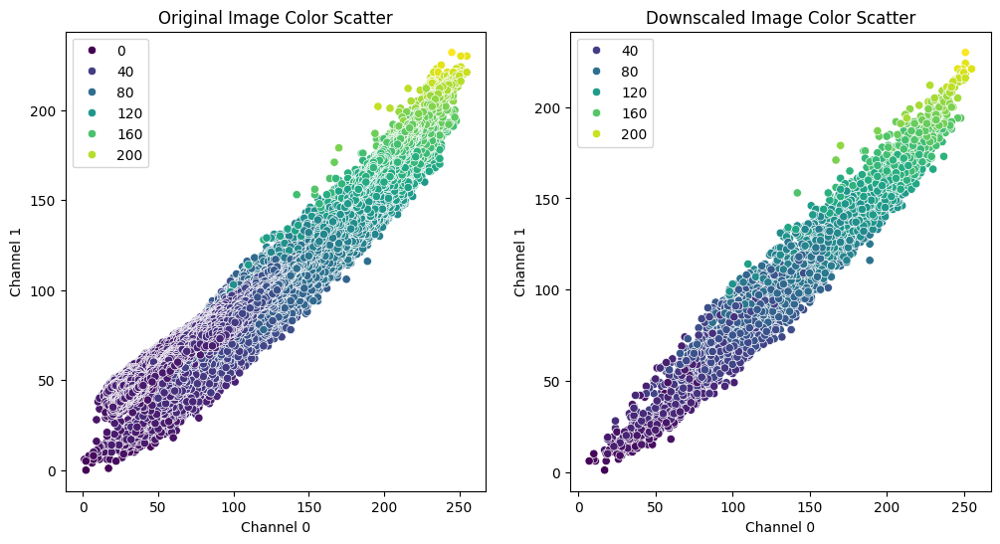

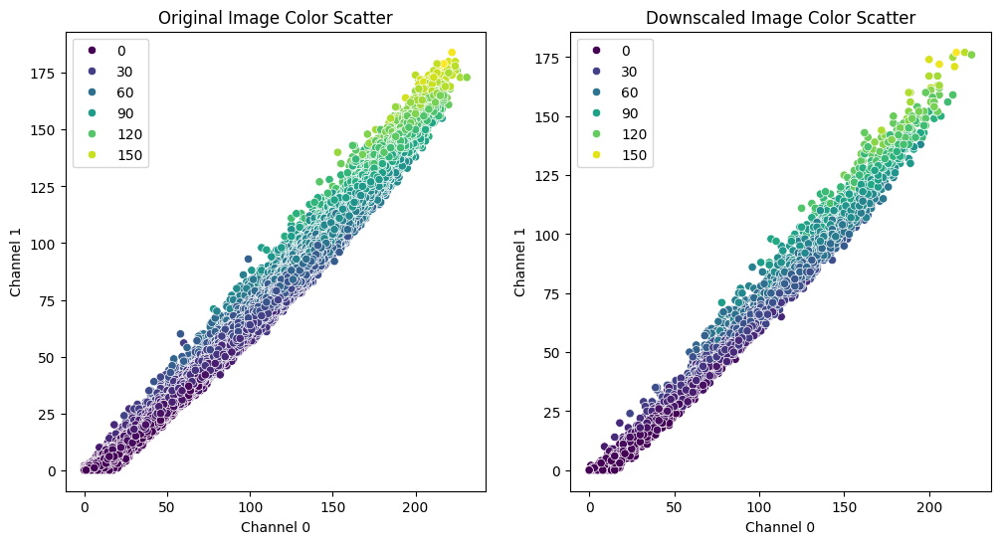

In [ ]:
for i in range(5):
  ori_img_sc_sample = ori_img_sc[i]
  seam_carving_downscaled_img_sample = seam_carving_downscaled_img[i]
  plot_color_scatter(ori_img_sc_sample, seam_carving_downscaled_img_sample)

In [ ]:
def quantize_colors(image, n_colors=8):
    pixels = np.reshape(image, (-1, 3))
    kmeans = KMeans(n_clusters=n_colors).fit(pixels)
    new_colors = kmeans.cluster_centers_[kmeans.predict(pixels)]
    return new_colors.reshape(image.shape)

def compute_histogram(image):
    hist = cv2.calcHist([np.uint8(image)], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

def compare_color_histograms(hist1, hist2):
    return cv2.compareHist(hist1, hist2, cv2.HISTCMP_INTERSECT)

def compare_images(original_image, downscaled_image):
    # Quantize colors
    orig_quantized = quantize_colors(original_image)
    down_quantized = quantize_colors(downscaled_image)

    # Compute color histograms
    orig_hist = compute_histogram(orig_quantized)
    down_hist = compute_histogram(down_quantized)

    # Compare histograms
    hist_similarity = compare_color_histograms(orig_hist, down_hist)
    hist_similarity /= np.sum(orig_hist)
    return hist_similarity

In [ ]:
for i in range(n_data):
  ori_img_sc_sample = ori_img_sc[i]
  seam_carving_downscaled_img_sample = seam_carving_downscaled_img[i]
  # Compare images
  hist_similarity = compare_images(ori_img_sc_sample, seam_carving_downscaled_img_sample)
  # Print results
  hist_sim_average = np.mean(hist_similarity)
print(f'Average Histogram Similarity: {hist_sim_average}')

Average Histogram Similarity: 0.4876944090873246


###DPID

In [ ]:
# Compute Entropy
original_entropy = shannon_entropy(ori_img_dpid_sample)
downscaled_entropy = shannon_entropy(dpid_downscaled_img_sample*255)
print(f'Original Entropy: {original_entropy}')
print(f'Downscaled Entropy: {downscaled_entropy}')

Original Entropy: 7.628582403618913
Downscaled Entropy: 13.584962500721158


In [ ]:
def plot_color_histograms(original, downscaled):
    color = ('r', 'g', 'b')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Color Histograms')

    ax1.set_title('Original')
    for i, col in enumerate(color):
        orig_hist = cv2.calcHist([np.uint8(original)], [i], None, [256], [0, 256])
        ax1.plot(orig_hist, color=col)
    ax1.set_xlabel('Pixel Value')
    ax1.set_ylabel('Frequency')

    ax2.set_title('Downscaled')
    for i, col in enumerate(color):
        down_hist = cv2.calcHist([np.uint8(downscaled)], [i], None, [256], [0, 256])
        ax2.plot(down_hist, color=col)
    ax2.set_xlabel('Pixel Value')
    ax2.set_ylabel('Frequency')

    plt.show()

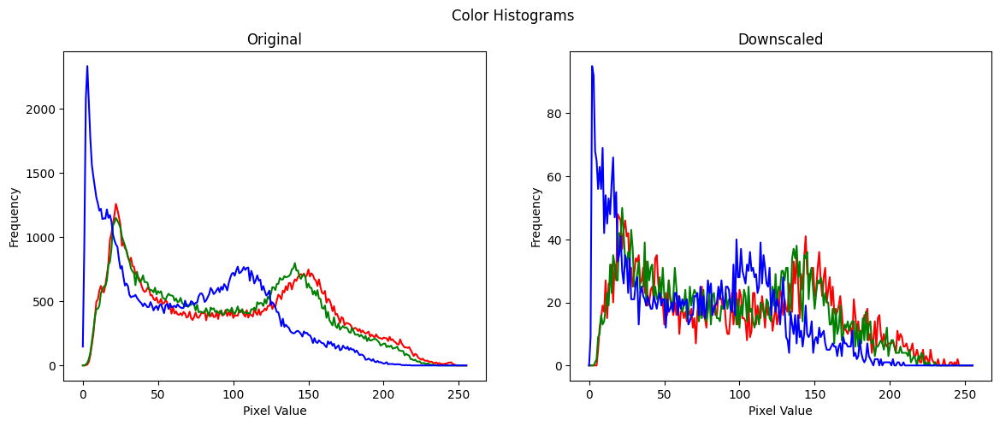

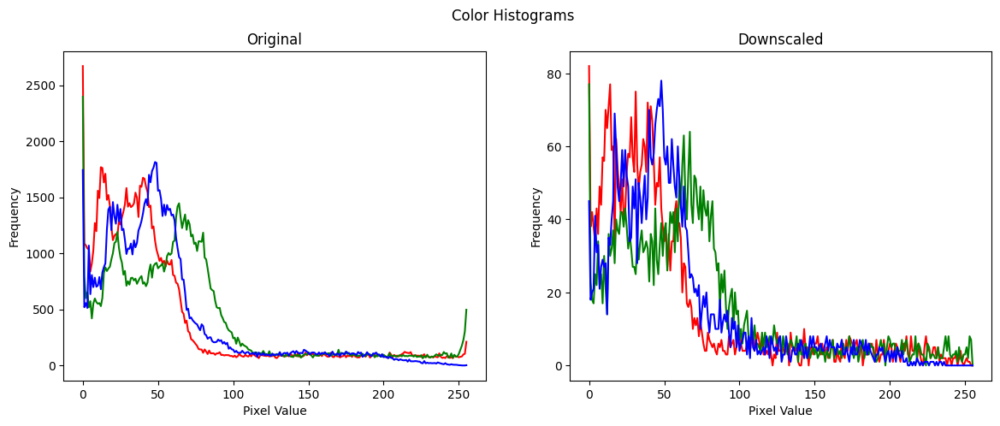

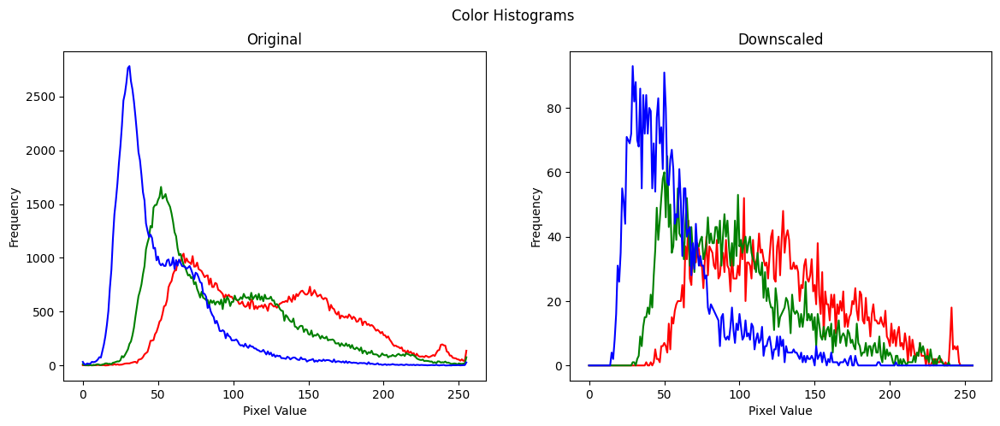

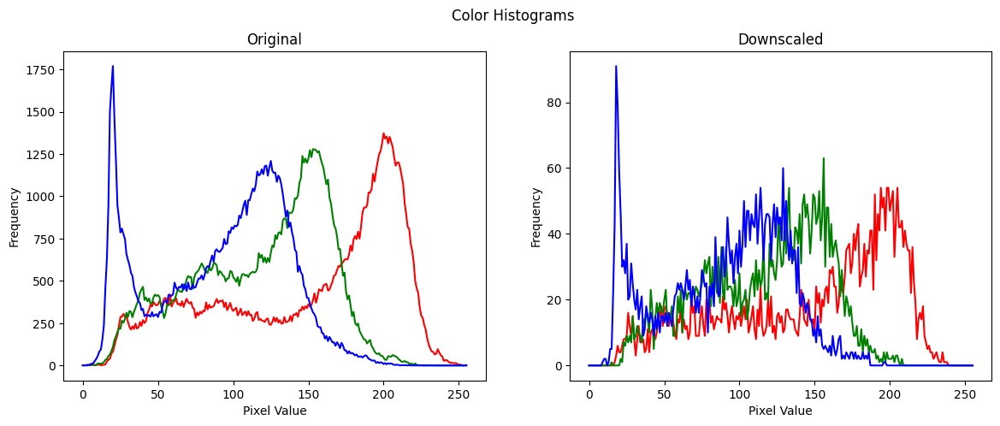

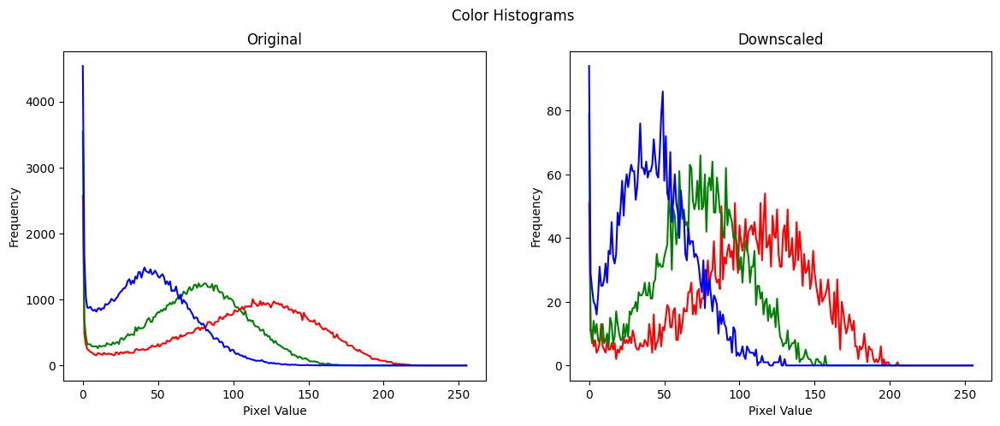

In [ ]:
for i in range(5):  # Plot histograms for 5 samples
    plot_color_histograms(ori_img_dpid[i], dpid_downscaled_img[i]*255)

In [ ]:
def get_dominant_colors(image, k=5):
    pixels = np.float32(image.reshape(-1, 3))
    _, labels, palette = cv2.kmeans(pixels, k, None,
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                                    10, cv2.KMEANS_RANDOM_CENTERS)
    _, counts = np.unique(labels, return_counts=True)
    dominant_colors = palette[np.argsort(-counts)]
    return dominant_colors.astype(int), counts

def plot_dominant_colors(dominant_colors, counts):
    plt.figure(figsize=(8, 4))
    plt.pie(counts, labels=[f'#{r:02x}{g:02x}{b:02x}' for r, g, b in dominant_colors],
            colors=[(r/255, g/255, b/255) for r, g, b in dominant_colors], startangle=90)
    plt.axis('equal')
    plt.title('Dominant Colors')
    plt.show()

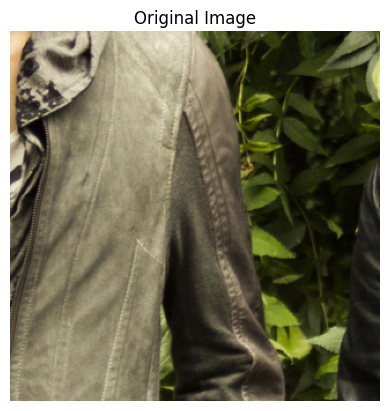

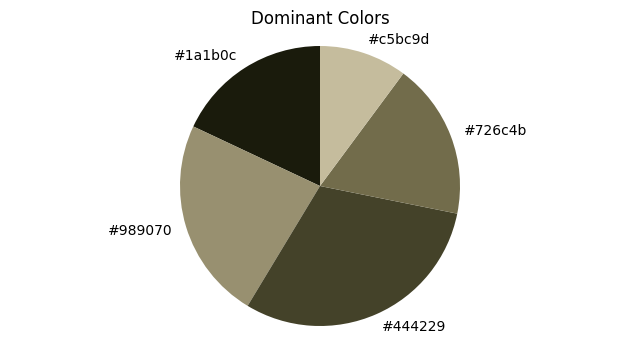

Color: #1a1b0c, Percentage: 18.01%
Color: #989070, Percentage: 23.35%
Color: #444229, Percentage: 30.48%
Color: #726c4b, Percentage: 18.02%
Color: #c5bc9d, Percentage: 10.15%


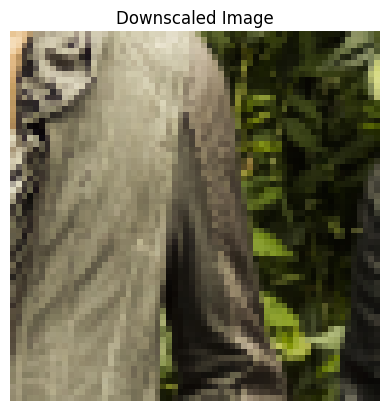

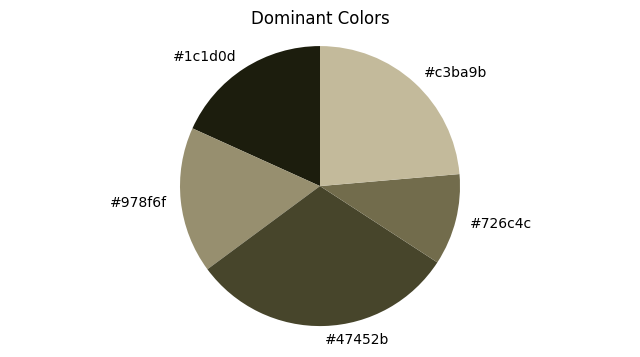

Color: #1c1d0d, Percentage: 18.24%
Color: #978f6f, Percentage: 16.89%
Color: #47452b, Percentage: 30.69%
Color: #726c4c, Percentage: 10.55%
Color: #c3ba9b, Percentage: 23.63%


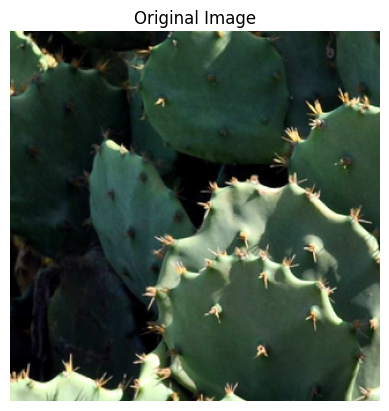

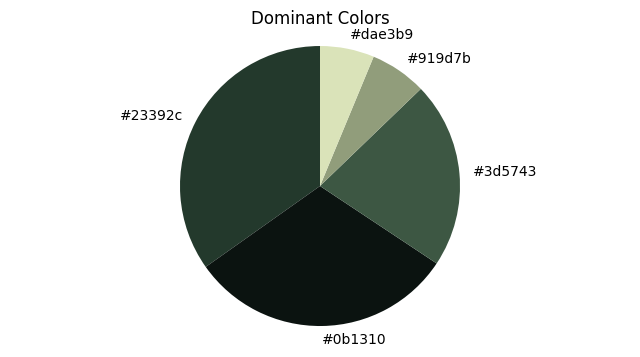

Color: #23392c, Percentage: 34.81%
Color: #0b1310, Percentage: 30.87%
Color: #3d5743, Percentage: 21.53%
Color: #919d7b, Percentage: 6.54%
Color: #dae3b9, Percentage: 6.26%


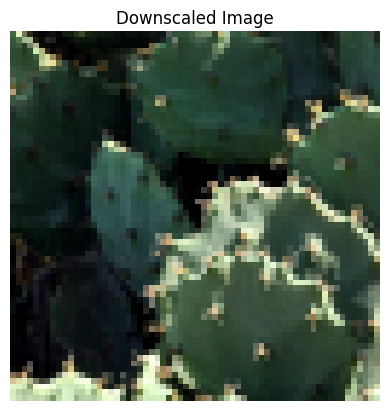

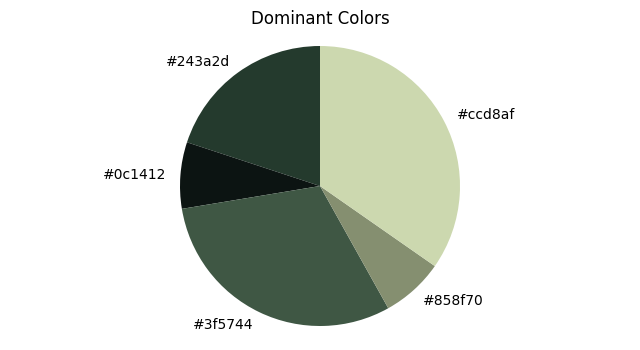

Color: #243a2d, Percentage: 19.95%
Color: #0c1412, Percentage: 7.67%
Color: #3f5744, Percentage: 30.49%
Color: #858f70, Percentage: 7.20%
Color: #ccd8af, Percentage: 34.69%


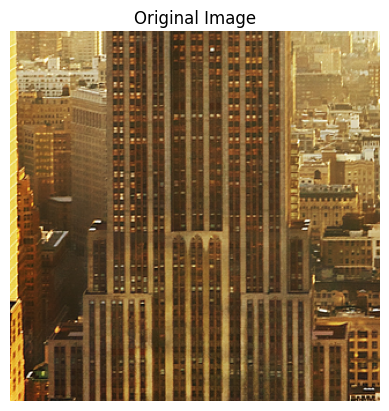

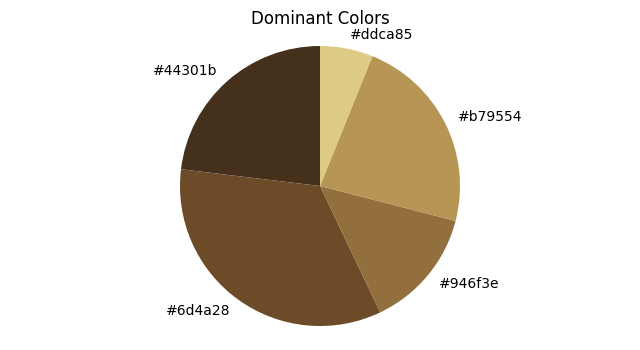

Color: #44301b, Percentage: 23.09%
Color: #6d4a28, Percentage: 33.99%
Color: #946f3e, Percentage: 13.90%
Color: #b79554, Percentage: 22.90%
Color: #ddca85, Percentage: 6.11%


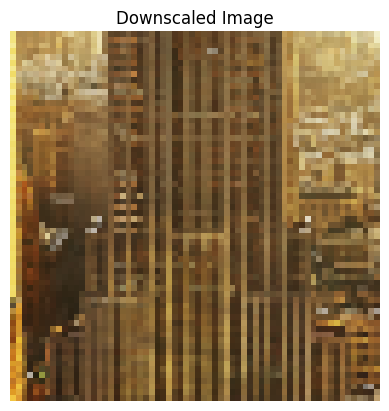

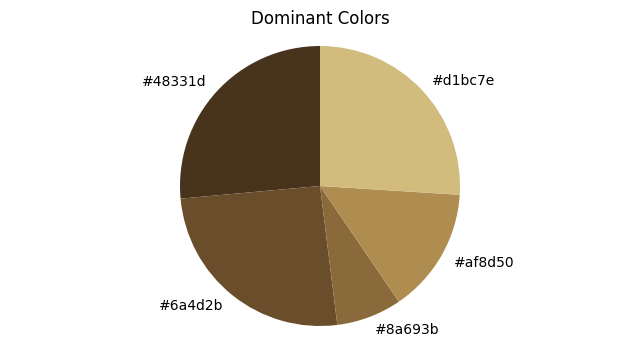

Color: #48331d, Percentage: 26.44%
Color: #6a4d2b, Percentage: 25.54%
Color: #8a693b, Percentage: 7.54%
Color: #af8d50, Percentage: 14.48%
Color: #d1bc7e, Percentage: 26.00%


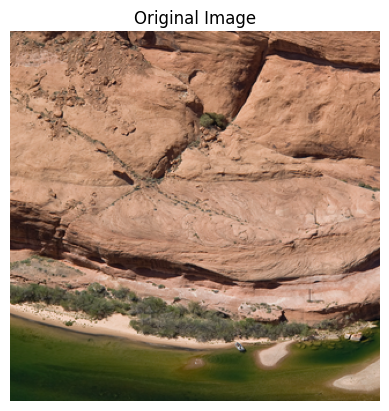

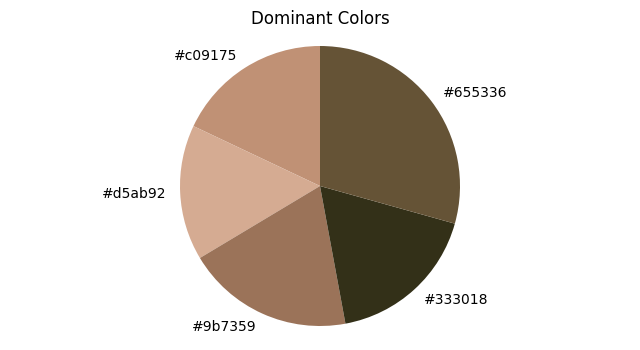

Color: #c09175, Percentage: 17.96%
Color: #d5ab92, Percentage: 15.63%
Color: #9b7359, Percentage: 19.31%
Color: #333018, Percentage: 17.75%
Color: #655336, Percentage: 29.33%


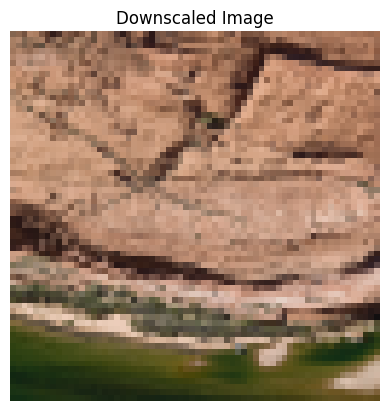

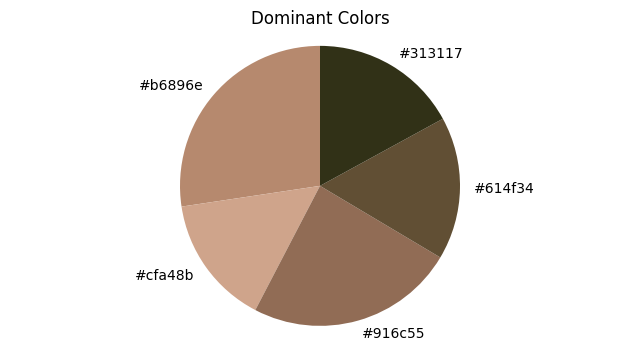

Color: #b6896e, Percentage: 27.37%
Color: #cfa48b, Percentage: 14.99%
Color: #916c55, Percentage: 24.10%
Color: #614f34, Percentage: 16.50%
Color: #313117, Percentage: 17.04%


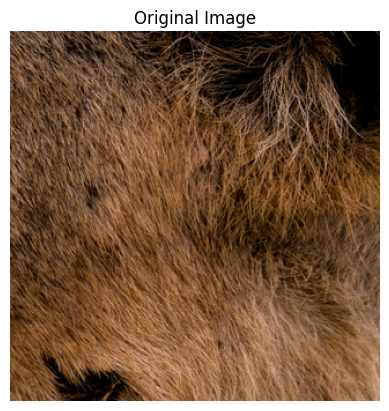

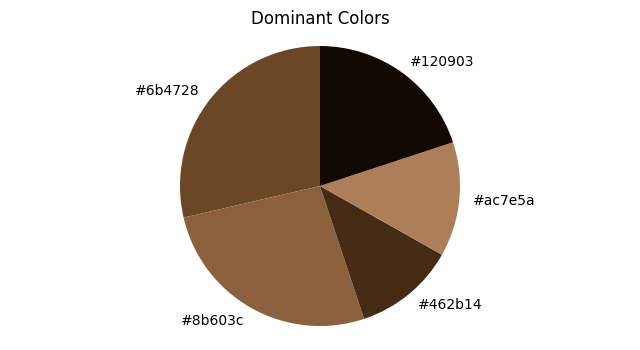

Color: #6b4728, Percentage: 28.63%
Color: #8b603c, Percentage: 26.48%
Color: #462b14, Percentage: 11.72%
Color: #ac7e5a, Percentage: 13.23%
Color: #120903, Percentage: 19.94%


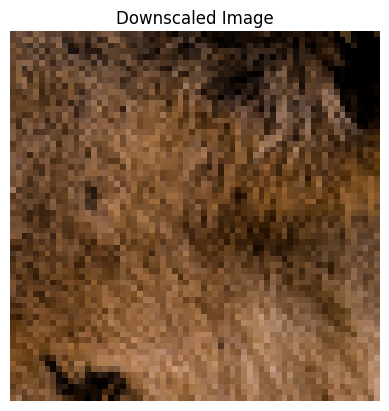

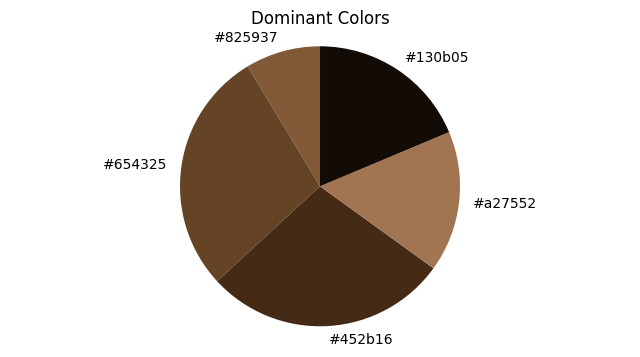

Color: #825937, Percentage: 8.64%
Color: #654325, Percentage: 28.22%
Color: #452b16, Percentage: 28.17%
Color: #a27552, Percentage: 16.28%
Color: #130b05, Percentage: 18.68%


In [ ]:
for i in range(5):
    ori_img_dpid_sample = ori_img_dpid[i]
    dpid_downscaled_img_sample = dpid_downscaled_img[i]

    dominant_colors_ori, counts_ori = get_dominant_colors(ori_img_dpid_sample, k=5)
    dominant_colors_dwn, counts_dwn = get_dominant_colors(dpid_downscaled_img_sample*255, k=5)

    plt.imshow(ori_img_dpid_sample)
    plt.title('Original Image')
    plt.axis('off')
    plt.show()

    plot_dominant_colors(dominant_colors_ori, counts_ori)

    total_pixels_ori = np.sum(counts_ori)
    percentage_colors_ori = (counts_ori / total_pixels_ori) * 100

    for color, percentage in zip(dominant_colors_ori, percentage_colors_ori):
        print(f'Color: #{color[0]:02x}{color[1]:02x}{color[2]:02x}, Percentage: {percentage:.2f}%')

    plt.imshow(dpid_downscaled_img_sample)
    plt.title('Downscaled Image')
    plt.axis('off')
    plt.show()

    plot_dominant_colors(dominant_colors_dwn, counts_dwn)

    total_pixels_dwn = np.sum(counts_dwn)
    percentage_colors_dwn = (counts_dwn / total_pixels_dwn) * 100

    for color, percentage in zip(dominant_colors_dwn, percentage_colors_dwn):
        print(f'Color: #{color[0]:02x}{color[1]:02x}{color[2]:02x}, Percentage: {percentage:.2f}%')

In [ ]:
def plot_color_scatter(original, downscaled):
    orig_pixels = original.reshape(-1, 3)
    down_pixels = downscaled.reshape(-1, 3)

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    sns.scatterplot(x=orig_pixels[:, 0], y=orig_pixels[:, 1], hue=orig_pixels[:, 2], palette="viridis", ax=axs[0])
    axs[0].set_title('Original Image Color Scatter')
    axs[0].set_xlabel('Channel 0')
    axs[0].set_ylabel('Channel 1')

    sns.scatterplot(x=down_pixels[:, 0], y=down_pixels[:, 1], hue=down_pixels[:, 2], palette="viridis", ax=axs[1])
    axs[1].set_title('Downscaled Image Color Scatter')
    axs[1].set_xlabel('Channel 0')
    axs[1].set_ylabel('Channel 1')

    plt.show()

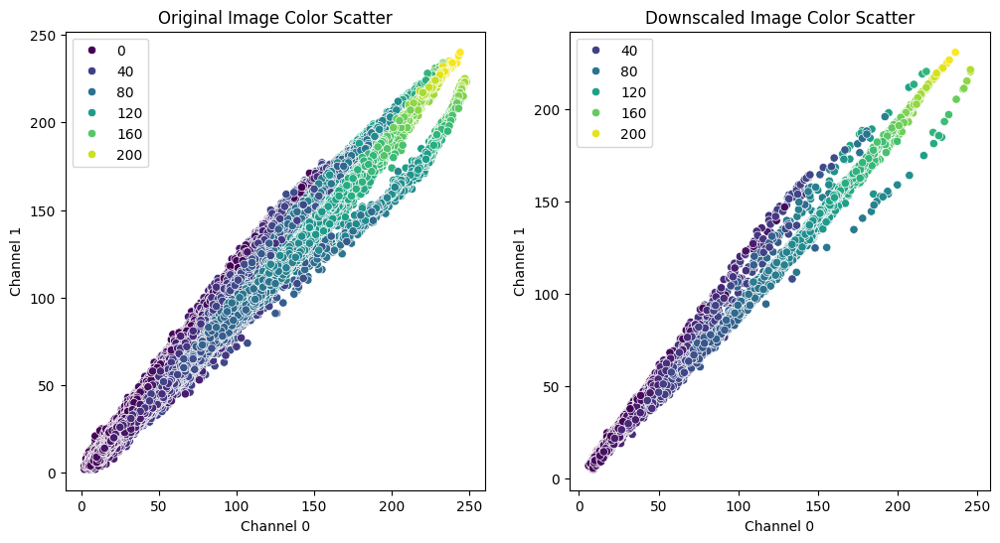

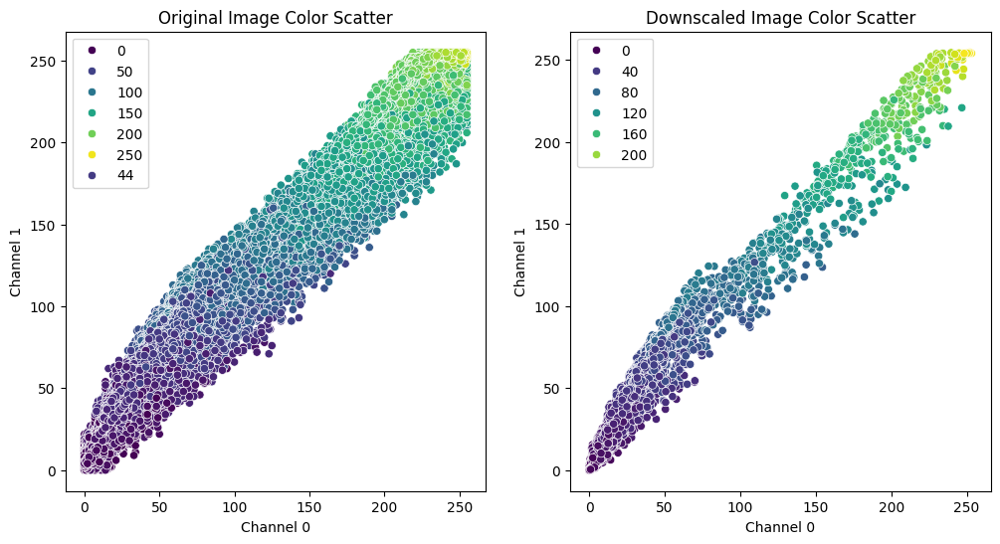

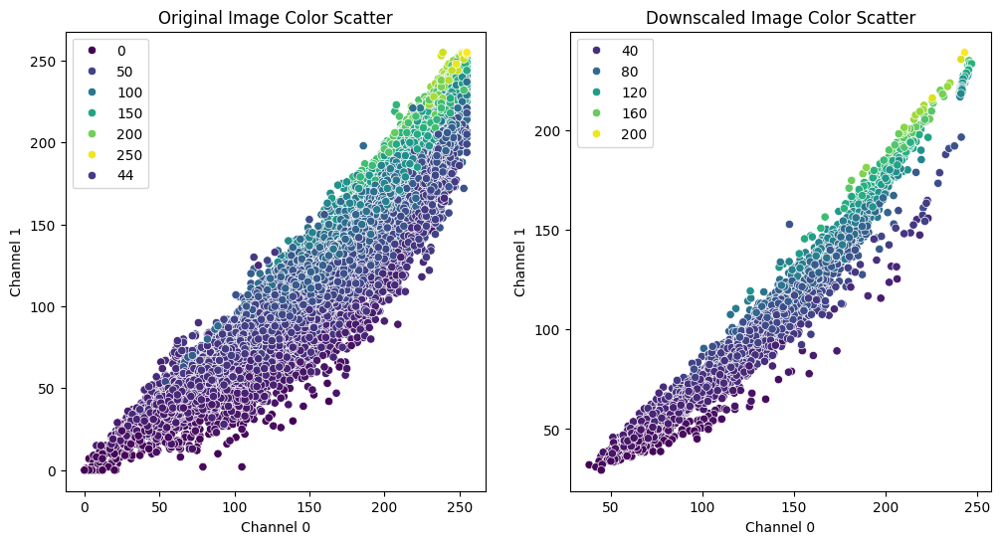

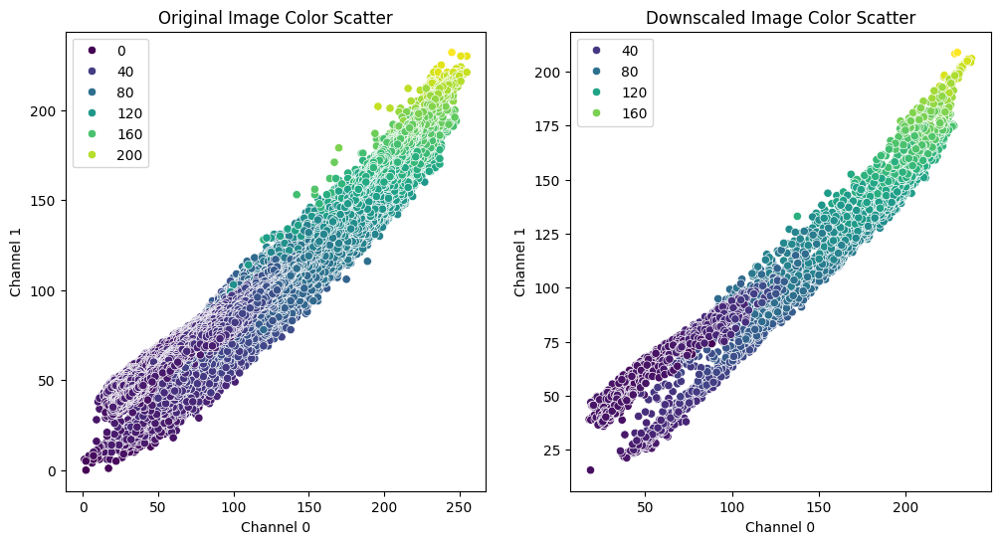

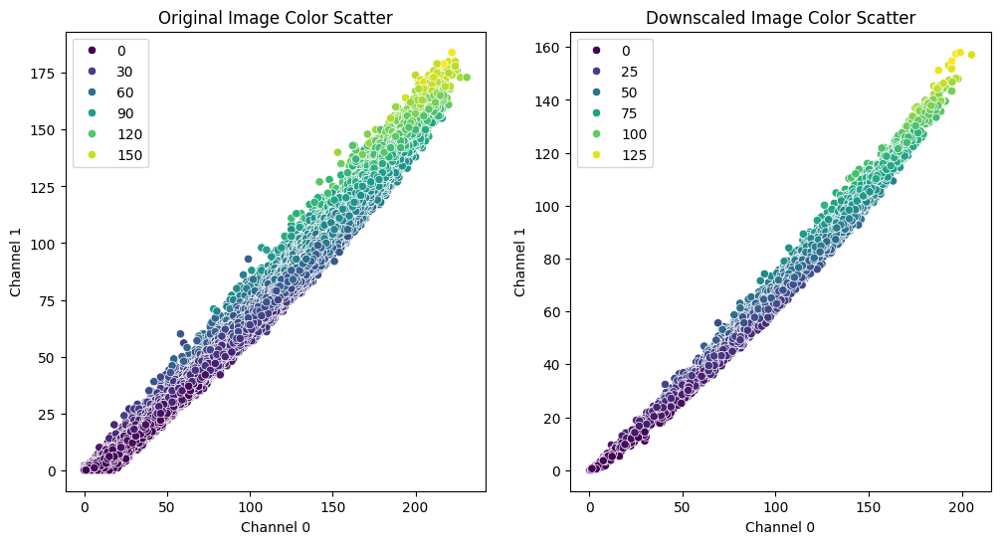

In [ ]:
for i in range(5):
  ori_img_dpid_sample = ori_img_dpid[i]
  dpid_downscaled_img_sample = dpid_downscaled_img[i]
  plot_color_scatter(ori_img_dpid_sample, dpid_downscaled_img_sample*255)

In [ ]:
def quantize_colors(image, n_colors=8):
    pixels = np.reshape(image, (-1, 3))
    kmeans = KMeans(n_clusters=n_colors).fit(pixels)
    new_colors = kmeans.cluster_centers_[kmeans.predict(pixels)]
    return new_colors.reshape(image.shape)

def compute_histogram(image):
    hist = cv2.calcHist([np.uint8(image)], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

def compare_color_histograms(hist1, hist2):
    return cv2.compareHist(hist1, hist2, cv2.HISTCMP_INTERSECT)

def compare_images(original_image, downscaled_image):
    # Quantize colors
    orig_quantized = quantize_colors(original_image)
    down_quantized = quantize_colors(downscaled_image)

    # Compute color histograms
    orig_hist = compute_histogram(orig_quantized)
    down_hist = compute_histogram(down_quantized)

    # Compare histograms
    hist_similarity = compare_color_histograms(orig_hist, down_hist)
    hist_similarity /= np.sum(orig_hist)
    return hist_similarity

In [ ]:
hist_similarities = []
for i in range(n_data):
  ori_img_dpid_sample = ori_img_dpid[i]
  dpid_downscaled_img_sample = dpid_downscaled_img[i]*255
  # Compare images
  hist_similarity = compare_images(ori_img_dpid_sample, dpid_downscaled_img_sample)
  # Print results
  hist_sim_average = np.mean(hist_similarity)
  hist_similarities.append(hist_similarity)
hist_sim_average = np.mean(hist_similarities)
print(f'Average Histogram Similarity: {hist_sim_average}')

Average Histogram Similarity: 0.6469631973092833
